In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In C:\Users\alexb\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In C:\Users\alexb\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In C:\Users\alexb\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


In [2]:
df = pd.read_excel('data/survey_resp.xlsx')

In [3]:
df

,timestamp,county,city,state,country,transport,safe_score,safe_score_pas,covid_place
0,2021-03-02 02:27:49.253,Santa Clara County,Sunnyvale,California,USA,Drive,7,8,NaN
1,2021-03-02 02:31:10.445,Los Angeles County,Pasadena,California,USA,Foot,3,3,"masks, alcohol wipes"
2,2021-03-02 02:32:17.160,Los Angeles County,Pasadena,California,USA,Drive,6,6,"Not sure, the only place I went to was the gro..."
3,2021-03-02 02:34:30.755,Los Angeles County,Pasadena,California,USA,Drive,4,4,"the grocery store, since it's the only place I..."
4,2021-03-02 02:34:41.312,Los Angeles County,Pasadena,California,USA,Foot,5,5,NaN
5,2021-03-02 02:35:49.414,Dane County,Madison,Wisconsin,USA,Flight,2,4,"In terms of within my city, bars and the state..."
6,2021-03-02 02:35:50.649,Bexar County,San Antonio,Texas,USA,Flight,4,3,"Schools; my mom is a PE teacher, and TX reopen..."
7,2021-03-02 02:39:03.474,Santa Clara County,San Jose,California,USA,Drive,8,6,Just watching the ICU available rooms drop to ...
8,2021-03-02 02:40:47.543,NaN,NaN,Virginia,USA,NaN,6,6,Restaurants
9,2021-03-02 02:44:19.793,Montgomery County,Bethesda,Maryland,USA,Flight,3,5,"Los Angeles (LAX, in particular)"


In [62]:
df = df[df["country"] == "USA"]
df = df[df["city"] != "San Jose"]

In [110]:
import requests
import urllib
import time
# https://gis.stackexchange.com/questions/173569/avoid-time-out-error-nominatim-geopy-openstreetmap
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/88.0.4324.182 Safari/537.36")
from geopy.exc import GeocoderTimedOut, GeocoderUnavailable

def do_geocode(address, attempt=1, max_attempts=5):
    try:
        time.sleep(1.1)
        return geolocator.geocode(address)
    except GeocoderTimedOut:
        if attempt <= max_attempts:
            return do_geocode(address, attempt=attempt+1)
        raise
    except GeocoderUnavailable as e:
        print("Bad address:", address)
        return None

def get_fips_from_latlon(lat, lon):
    #Encode parameters 
    params = urllib.parse.urlencode({'latitude': lat, 'longitude':lon, 'format':'json'})
    #Contruct request URL
    url = 'https://geo.fcc.gov/api/census/block/find?' + params
    #Get response from API
    response = requests.get(url)
    #Parse json in response
    data = response.json()
    return data['County']['FIPS']


def get_fips_code(row):
    # print("row:", row)
    address_str = ""
    for col in ["city", "county", "state"]:
        if str(row[col]) != "nan":
            address_str += row[col] + ", "
    address_str += row["country"]
    loc = do_geocode(address_str)
    if loc is not None:
        fips = get_fips_from_latlon(loc.latitude, loc.longitude)
        row["lat"] = loc.latitude
        row["lon"] = loc.longitude
    else:
        fips = None
        row["lat"] = None
        row["lon"] = None
    print("Got fips: {} from address: {}".format(fips, address_str))
    row["fips"] = fips
    return row

In [111]:
df = df.apply(get_fips_code, axis=1)

Got fips: 06085 from address: Sunnyvale, Santa Clara County, California, USA
Got fips: 06085 from address: Sunnyvale, Santa Clara County, California, USA
Got fips: 06037 from address: Pasadena, Los Angeles County, California, USA
Got fips: 06037 from address: Pasadena, Los Angeles County, California, USA
Got fips: 06037 from address: Pasadena, Los Angeles County, California, USA
Got fips: 06037 from address: Pasadena, Los Angeles County, California, USA
Got fips: 55025 from address: Madison, Dane County, Wisconsin, USA
Got fips: 48029 from address: San Antonio, Bexar County, Texas, USA
Got fips: 51147 from address: Virginia, USA
Got fips: 24031 from address: Bethesda, Montgomery County, Maryland, USA
Got fips: 13151 from address: McDonough County, Georgia, USA
Got fips: 36059 from address: New York City, Nassau County, New York, USA
Got fips: 06073 from address: San Diego, San Diego County, California, USA
Got fips: 06073 from address: Encinitas, San Diego County, California, USA
Got f

In [115]:
covid_df = pd.read_csv('data/us-counties.csv', dtype={'fips': object})

# The date caltech students left
covid_df = covid_df[covid_df["date"] == "2020-03-18"]
df = df.merge(covid_df[["fips", "cases"]], on="fips")

In [116]:
df.to_csv('data/survey_resp_with_more.csv')

# df = pd.read_csv('data/survey_resp_with_more.csv')

In [67]:
from urllib.request import urlopen
import json
import plotly.express as px
import pandas as pd

with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

In [135]:
cp_df = df.groupby('fips').mean()
cp_df.loc["06037"]["safe_score"] = df["safe_score_pas"].mean()
cp_df["cnt"] = df.groupby('fips').count()["transport"]
cp_df = cp_df.reset_index()

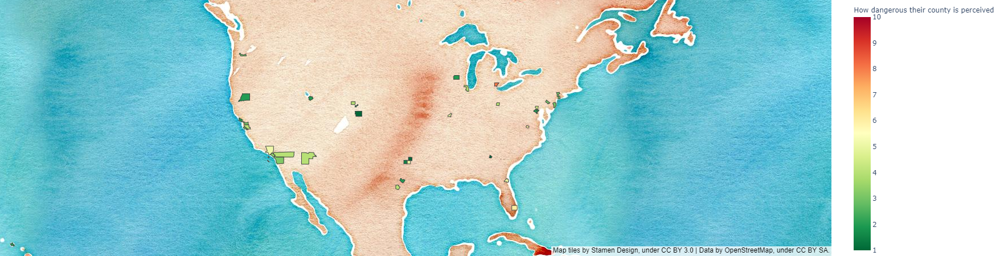

In [209]:
fig = px.choropleth_mapbox(cp_df, geojson=counties, locations='fips', color='safe_score',
                           color_continuous_scale="RdYlGn_r",
                           range_color=(1, 10),
                           mapbox_style="stamen-watercolor",# "carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=1,
                           labels={'safe_score':'How dangerous their county is perceived'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_geos(projection_type="mercator", 
        scope = 'north america',)
fig.show()

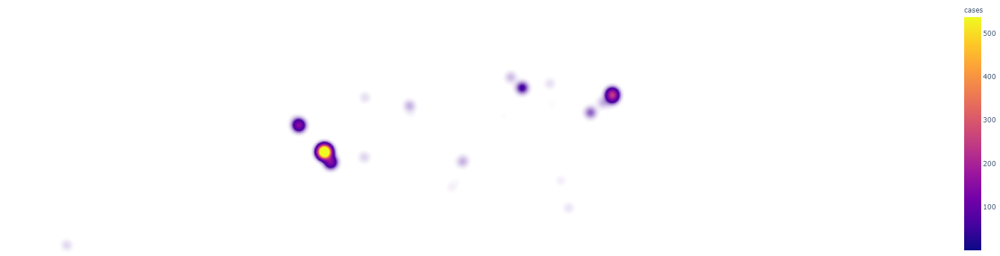

In [206]:
# Source: https://plotly.com/python/mapbox-density-heatmaps/
fig = px.density_mapbox(df, lat='lat', lon='lon', z='cases', radius=20,
                        center={"lat": 37.0902, "lon": -95.7129}, zoom=3,
                        mapbox_style="white-bg"# "stamen-watercolor"
                       )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_geos(projection_type="mercator", 
        scope = 'north america',)
fig.show()

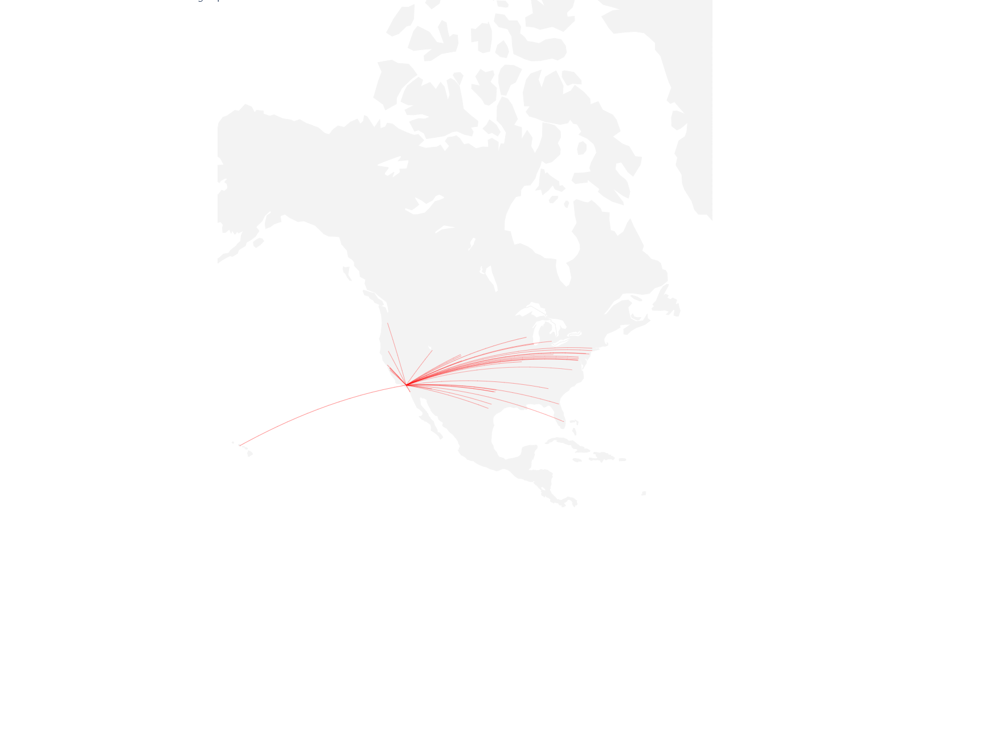

In [214]:
import plotly.graph_objects as go
import pandas as pd

# source: https://plotly.com/python/lines-on-maps/

pasa_lat = 34.1478
pasa_lon = -118.1445

fig = go.Figure()

# fig.add_trace(go.Scattergeo(
#     locationmode = 'USA-states',
#     lon = cp_df['lon'],
#     lat = cp_df['lat'],
#     hoverinfo = 'text',
#     text = cp_df['fips'],
#     mode = 'markers',
#     marker = dict(
#         size = 1,
#         color = 'rgb(255, 0, 0)',
#         line = dict(
#             width = 2,
#             color = 'rgba(68, 68, 68, 0)'
#         )
#     )))

flight_paths = []
for i in range(len(cp_df)):
    fig.add_trace(
        go.Scattergeo(
            locationmode = 'USA-states',
            lon = [pasa_lon, cp_df['lon'][i]],
            lat = [pasa_lat, cp_df['lat'][i]],
            mode = 'lines',
            line = dict(width = 1,color = 'red'),
            opacity = 0.3 + float(cp_df['cnt'][i]) / float(cp_df['cnt'].max())*0.7,
        )
    )
fig.update_geos(
    center={"lat": 37.0902, "lon": -95.7129},
)
fig.update_layout(
    title_text = 'March 2020 Caltech-exodus flight paths',
    showlegend = False,
    geo = dict(
        scope = 'north america',
        projection_type = 'mercator',
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(243, 243, 243)'# 'rgb(204, 204, 204)',
    ),
    margin={"r":0,"t":0,"l":0,"b":0},
    width=1000, height=1300,
)

fig.show()